# Doğrusal Olmayan Regreson Modelleri

In [3]:
import numpy as np
import pandas as pd 
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor

from warnings import filterwarnings
filterwarnings('ignore')

# KNN
Tahminler gözlem benzerliğine göre yapılır. Yeni gelen gözlemin diğer gözlemlere olan uzaklığı hesaplanır. En yakın k adet gözlemin y değerlerinin ortalaması olarak yeni gözlem değerine atanır.

In [5]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)

In [7]:
knn_model = KNeighborsRegressor().fit(X_train, y_train)

In [9]:
knn_model

KNeighborsRegressor()

In [11]:
knn_model.n_neighbors

5

In [13]:
knn_model.effective_metric_

'euclidean'

## Tahmin

In [15]:
y_pred = knn_model.predict(X_test)

In [17]:
np.sqrt(mean_squared_error(y_test, y_pred))

426.6570764525201

In [19]:
RMSE = [] 

for k in range(10):
    k = k+1
    knn_model = KNeighborsRegressor(n_neighbors = k).fit(X_train, y_train)
    y_pred = knn_model.predict(X_train) 
    rmse = np.sqrt(mean_squared_error(y_train,y_pred)) 
    RMSE.append(rmse) 
    print("k =" , k , "için RMSE değeri: ", rmse)


k = 1 için RMSE değeri:  0.0
k = 2 için RMSE değeri:  179.52761335480352
k = 3 için RMSE değeri:  205.20157172291863
k = 4 için RMSE değeri:  220.5139794876305
k = 5 için RMSE değeri:  239.6467132541376
k = 6 için RMSE değeri:  243.5904190007242
k = 7 için RMSE değeri:  258.1478781634636
k = 8 için RMSE değeri:  266.05374203349805
k = 9 için RMSE değeri:  269.73782093553376
k = 10 için RMSE değeri:  271.2798300436963


## Model Tuning

In [21]:
from sklearn.model_selection import GridSearchCV

In [23]:
knn_params = {'n_neighbors': np.arange(1,30,1)}
#fonksiyonun isimlendirmesi her ne aynısı yazılmalı. 
#1'den 30'a kadar olan komşuluk değerlerini modelde deneyip hangisinin daha iyi olduğu sonucuna ulaşılır.

In [25]:
knn = KNeighborsRegressor()

In [27]:
knn_cv_model = GridSearchCV(knn, knn_params, cv = 10)

In [29]:
knn_cv_model.fit(X_train, y_train)#model kurma işlemi

GridSearchCV(cv=10, estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])})

In [31]:
knn_cv_model.best_params_["n_neighbors"]#en uygun komşu değeri

8

In [33]:
RMSE = [] 
RMSE_CV = []
for k in range(10):
    k = k+1
    knn_model = KNeighborsRegressor(n_neighbors = k).fit(X_train, y_train)
    y_pred = knn_model.predict(X_train) 
    rmse = np.sqrt(mean_squared_error(y_train,y_pred)) 
    rmse_cv = np.sqrt(-1*cross_val_score(knn_model, X_train, y_train, cv=10, 
                                         scoring = "neg_mean_squared_error").mean())
    RMSE.append(rmse) 
    RMSE_CV.append(rmse_cv)
    print("k =" , k , "için RMSE değeri: ", rmse, "RMSE_CV değeri: ", rmse_cv )


k = 1 için RMSE değeri:  0.0 RMSE_CV değeri:  325.3947514706382
k = 2 için RMSE değeri:  179.52761335480352 RMSE_CV değeri:  293.24000183333817
k = 3 için RMSE değeri:  205.20157172291863 RMSE_CV değeri:  283.7486667487823
k = 4 için RMSE değeri:  220.5139794876305 RMSE_CV değeri:  286.3240222024089
k = 5 için RMSE değeri:  239.6467132541376 RMSE_CV değeri:  290.0705466132226
k = 6 için RMSE değeri:  243.5904190007242 RMSE_CV değeri:  298.1263115575851
k = 7 için RMSE değeri:  258.1478781634636 RMSE_CV değeri:  294.77070479194987
k = 8 için RMSE değeri:  266.05374203349805 RMSE_CV değeri:  291.98672028891235
k = 9 için RMSE değeri:  269.73782093553376 RMSE_CV değeri:  295.7162739573105
k = 10 için RMSE değeri:  271.2798300436963 RMSE_CV değeri:  301.31047022701154


In [35]:
knn_tuned = KNeighborsRegressor(n_neighbors = knn_cv_model.best_params_["n_neighbors"])#tuned edilmiş modelin nesnesi

In [37]:
knn_tuned.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=8)

In [39]:
np.sqrt(mean_squared_error(y_test, knn_tuned.predict(X_test)))#tuned edilmiş knn modelinin test hatası

413.7094731463598

# SVR (Destek Vektör Regresyonu)
Amacı bir marjin aralığına maksimum noktayı en küçük hata ile alabilecek şekilde doğru ya da eğriyi belirlemektir.\
Aykırılıklara karşı daha az duyarlı olan algoritmalara robust algoritma denir. SVR robust regresyon yöntemi olarak da adlandırılır. ekk'dan(en küçük kareler) dolayı linear modelin eğrisi aykırı değerler neticesinde değişime açıkken SVR doğrusu bu duruma direnir.

In [42]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)

In [44]:
X_train = pd.DataFrame(X_train["Hits"])
X_test = pd.DataFrame(X_test["Hits"])

In [46]:
from sklearn.svm import SVR

In [58]:
svr_model = SVR(kernel="linear").fit(X_train, y_train)

In [60]:
svr_model.predict(X_train)[0:5] #bağımlı değişkenlerin tahmin edilen değerleri

array([403.52804878, 666.91219512, 706.66829268, 194.80853659,
       423.40609756])

In [62]:
print ("y = {0} + {1} x".format(svr_model.intercept_[0], 
                                svr_model.coef_[0][0]))
#doğrusal SVR model denklemi

y = -48.69756097561513 + 4.969512195122093 x


In [64]:
X_train["Hits"][0:1]

183    91.0
Name: Hits, dtype: float64

In [66]:
-48.69756097561513 + 4.969512195122093*91

403.5280487804953

In [68]:
y_pred = svr_model.predict(X_train)

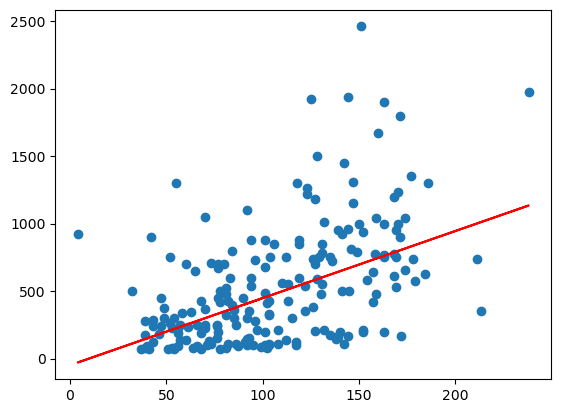

In [70]:
plt.scatter(X_train, y_train)
plt.plot(X_train,y_pred, color = "r")

In [72]:
from sklearn.linear_model import LinearRegression
lm_model = LinearRegression().fit(X_train, y_train)
lm_pred  = lm_model.predict(X_train)
print("y = {0} + {1} x".format(lm_model.intercept_, lm_model.coef_[0]))

y = -8.814095480334345 + 5.172456135470686 x


In [74]:
-8.814095480334572 + 5.1724561354706875*91

461.879412847498

Text(0, 0.5, 'Maaş (Salary)')

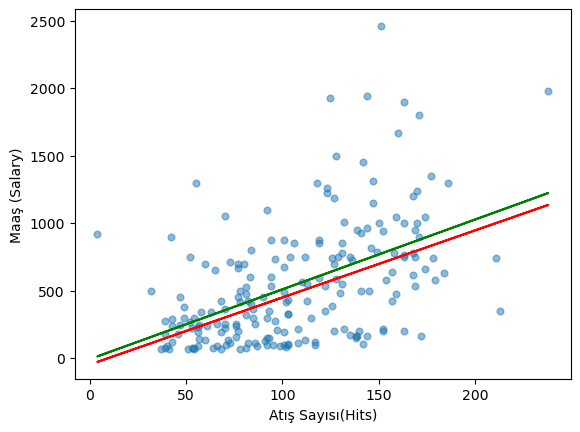

In [76]:
plt.scatter(X_train, y_train, alpha=0.5, s=23)
plt.plot(X_train, lm_pred, 'g')
plt.plot(X_train, y_pred, color='r')

plt.xlabel("Atış Sayısı(Hits)")
plt.ylabel("Maaş (Salary)")

## Tahmin

In [78]:
print ("y = {0} + {1} x".format(svr_model.intercept_[0], svr_model.coef_[0][0])) 

y = -48.69756097561513 + 4.969512195122093 x


In [80]:
svr_model.predict([[91]])

array([403.52804878])

In [82]:
y_pred = svr_model.predict(X_test)

In [84]:
np.sqrt(mean_squared_error(y_test, y_pred))

459.0187960365147

In [86]:
svr_model

SVR(kernel='linear')

## Model Tuning

In [90]:
svr_params = {"C": np.arange(0.1,2,0.1)}
svr_cv_model = GridSearchCV(svr_model, svr_params, cv = 10).fit(X_train,y_train)

In [92]:
pd.Series(svr_cv_model.best_params_)[0]

0.1

In [98]:
svr_tuned = SVR(kernel='linear', 
                C = pd.Series(svr_cv_model.best_params_)[0]).fit(X_train, y_train)



In [100]:
y_pred = svr_tuned.predict(X_test)

In [102]:
np.sqrt(mean_squared_error(y_test, y_pred))

458.198966781116

In [104]:
np.sqrt(mean_squared_error(y_test, y_pred))

458.198966781116

# Doğrusal Olmayan SVR

In [106]:
np.random.seed(3)

x_sim = np.random.uniform(2, 10, 145)
y_sim = np.sin(x_sim) + np.random.normal(0, 0.4, 145)

x_outliers = np.arange(2.5, 5, 0.5)
y_outliers = -5*np.ones(5)

x_sim_idx = np.argsort(np.concatenate([x_sim, x_outliers]))
x_sim = np.concatenate([x_sim, x_outliers])[x_sim_idx]
y_sim = np.concatenate([y_sim, y_outliers])[x_sim_idx]

In [110]:

from sklearn.linear_model import LinearRegression
ols = LinearRegression()
ols.fit(np.sin(x_sim[:, np.newaxis]), y_sim)
ols_pred = ols.predict(np.sin(x_sim[:, np.newaxis]))

from sklearn.svm import SVR
eps = 0.1
svr = SVR(kernel='rbf', epsilon = eps)
svr.fit(x_sim[:, np.newaxis], y_sim)
svr_pred = svr.predict(x_sim[:, np.newaxis])

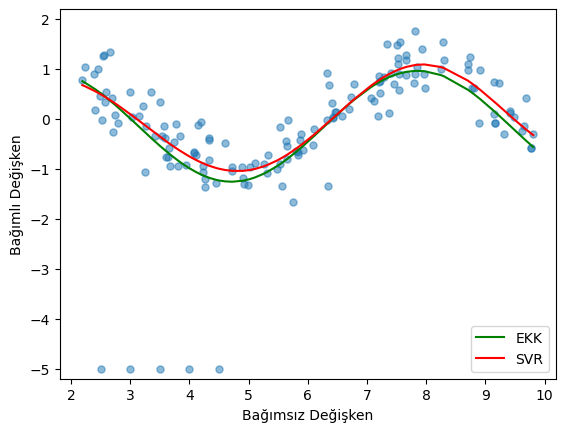

In [112]:
plt.scatter(x_sim, y_sim, alpha=0.5, s=26)
plt_ols, = plt.plot(x_sim, ols_pred, 'g')
plt_svr, = plt.plot(x_sim, svr_pred, color='r')
plt.xlabel("Bağımsız Değişken")
plt.ylabel("Bağımlı Değişken")
plt.ylim(-5.2, 2.2)
plt.legend([plt_ols, plt_svr], ['EKK', 'SVR'], loc = 4);

In [114]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)

In [120]:
svr_rbf = SVR(kernel="rbf").fit(X_train, y_train)

## Tahmin

In [122]:
y_pred = svr_rbf.predict(X_test)

In [124]:
np.sqrt(mean_squared_error(y_test, y_pred))

460.0032657244849

## Model Tuning

In [126]:
svr_rbf

SVR()

In [128]:
svr_params = {"C": [0.01, 0.1,0.4,5,10,20,30,40,50]} #parametre seti
svr_cv_model = GridSearchCV(svr_rbf,svr_params, cv = 10)#svr_ebf modelini kullanarak verilen svr_params değerleri içerisinde, 
#10 katlı cross validation uygulayarak gridsearch yap.
svr_cv_model.fit(X_train, y_train)#model kurma işlemi

GridSearchCV(cv=10, estimator=SVR(),
             param_grid={'C': [0.01, 0.1, 0.4, 5, 10, 20, 30, 40, 50]})

In [130]:
pd.Series(svr_cv_model.best_params_)[0]#optimum değeri alır

50

In [134]:
svr_tuned = SVR(kernel="rbf", C = pd.Series(svr_cv_model.best_params_)[0]).fit(X_train, 
                                                                        y_train)

In [136]:
y_pred = svr_tuned.predict(X_test)#X_test setinin bağımsız değişkenlerini kullanarak test setinin y bağımlı değişkenlerini tahmin et.
np.sqrt(mean_squared_error(y_test, y_pred))

428.00406888095694

# Çok Katmanlı Algılayıcı
Yapay sinir ağları sınıflandırma ve regresyon problemleri için kullanılabilen kuvvetli makine öğrenmesi algoritmalarındandır. Değişken standartlaşma işleminin yapılması gerekmektedir.

In [139]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)

In [141]:
from sklearn.preprocessing import StandardScaler

In [143]:
scaler = StandardScaler()
scaler.fit(X_train)

StandardScaler()

In [145]:
X_train_scaled = scaler.transform(X_train)#train seti standartlaştırma

In [147]:
X_test_scaled = scaler.transform(X_test)#test seti standartlaştırma

In [149]:
from sklearn.neural_network import MLPRegressor

In [151]:
mlp_model = MLPRegressor(hidden_layer_sizes = (100,20)).fit(X_train_scaled, y_train)

In [153]:
mlp_model

MLPRegressor(hidden_layer_sizes=(100, 20))

In [155]:
mlp_model.n_layers_

4

In [157]:
mlp_model.hidden_layer_sizes

(100, 20)

## Tahmin

In [159]:
y_pred = mlp_model.predict(X_test_scaled)

In [161]:
np.sqrt(mean_squared_error(y_test, y_pred))

527.4270090447499

## Model Tuning

In [163]:
mlp_model

MLPRegressor(hidden_layer_sizes=(100, 20))

In [165]:
mlp_params = {'alpha': [0.1, 0.01,0.02,0.005],
             'hidden_layer_sizes': [(20,20),(100,50,150),(300,200,150)],
             'activation': ['relu','logistic']}

In [167]:
mlp_cv_model = GridSearchCV(mlp_model, mlp_params, cv = 10)

In [169]:
mlp_cv_model.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=MLPRegressor(hidden_layer_sizes=(100, 20)),
             param_grid={'activation': ['relu', 'logistic'],
                         'alpha': [0.1, 0.01, 0.02, 0.005],
                         'hidden_layer_sizes': [(20, 20), (100, 50, 150),
                                                (300, 200, 150)]})

In [170]:
mlp_cv_model.best_params_

{'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (100, 50, 150)}

In [406]:
mlp_tuned = MLPRegressor(alpha = 0.01, hidden_layer_sizes = (100,50,150))

In [408]:
mlp_tuned.fit(X_train_scaled, y_train)

MLPRegressor(alpha=0.01, hidden_layer_sizes=(100, 50, 150))

In [410]:
y_pred = mlp_tuned.predict(X_test_scaled)

In [412]:
np.sqrt(mean_squared_error(y_test, y_pred))

357.9326167278625

# CART
Amacı veri seti içerisindeki karmaşık yapıları basit karar yapılarına dönültürmektir. Heterojen verisetleri belirnemiş bir hedef değişkene göre homojen alt gruplara ayırır.\
Ağacın en tepesindeki değişken ayırt edilicilik anlamında en etkili değişendir. Çok fazla dallanma overfitting'e neden olur. Genellenebilirlik kaygısı taşımıyorsa oldukça etkili, başarılı tahminler verir.

In [182]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)


In [184]:
X_train = pd.DataFrame(X_train["Hits"])
X_test = pd.DataFrame(X_test["Hits"])

In [186]:
cart_model = DecisionTreeRegressor(min_samples_split = 2)

In [404]:
#?cart_model

In [190]:
cart_model.fit(X_train, y_train)

DecisionTreeRegressor()

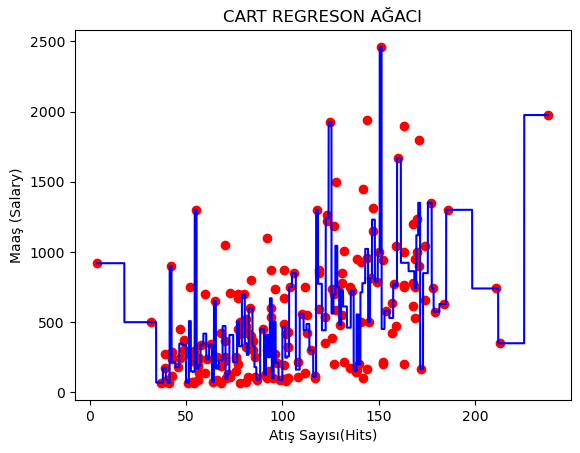

In [192]:
X_grid = np.arange(min(np.array(X_train)),max(np.array(X_train)), 0.01) 
X_grid = X_grid.reshape((len(X_grid), 1))  
plt.scatter(X_train, y_train, color = 'red') 
plt.plot(X_grid, cart_model.predict(X_grid), color = 'blue')  
plt.title('CART REGRESON AĞACI')  
plt.xlabel('Atış Sayısı(Hits)') 
plt.ylabel('Maaş (Salary)') ;

In [ ]:
#!pip install skompiler
#!pip install astor

In [200]:
from skompiler import skompile

In [206]:
print(skompile(cart_model.predict).to('python/code'))#ağacın karar modelini python kodu şeklinde yazılımı

((920.0 if x[0] <= 18.0 else ((500.0 if x[0] <= 34.5 else (70.0 if x[0] <= 
    38.0 else 175.0) if x[0] <= 39.5 else 90.0 if x[0] <= 40.5 else 67.5) if
    x[0] <= 41.5 else 900.0 if x[0] <= 42.5 else (((((215.55566666666664 if
    x[0] <= 44.5 else 180.0) if x[0] <= 46.5 else 347.5 if x[0] <= 48.0 else
    337.5) if x[0] <= 50.0 else 70.0) if x[0] <= 51.5 else 507.5) if x[0] <=
    52.5 else 150.0 if x[0] <= 53.5 else 146.83333333333334) if x[0] <= 
    54.5 else 1300.0 if x[0] <= 55.5 else (170.0 if x[0] <= 56.5 else 
    193.75) if x[0] <= 57.5 else ((((((340.0 if x[0] <= 59.0 else 418.5) if
    x[0] <= 60.5 else 235.0 if x[0] <= 62.0 else 341.667) if x[0] <= 63.5 else
    75.0) if x[0] <= 64.5 else 650.0) if x[0] <= 65.5 else 170.0 if x[0] <=
    67.0 else 228.66666666666666) if x[0] <= 69.0 else 472.5) if x[0] <= 
    70.5 else (100.0 if x[0] <= 71.5 else 130.0) if x[0] <= 72.5 else 
    409.1665 if x[0] <= 74.5 else 215.0) if x[0] <= 76.5 else (((505.0 if x
    [0] <= 77.5 else 

## Tahmin

In [208]:
x = [91]

In [210]:
(345.2011551724138 if x[0] <= 117.5 else ((((1300.0 if x[0] <= 118.5 else 
    641.0) if x[0] <= 122.5 else 1468.5236666666667) if x[0] <= 125.5 else 
    621.9679230769232) if x[0] <= 143.0 else (958.6111111111111 if x[0] <= 
    150.5 else 2460.0) if x[0] <= 151.5 else 499.1666666666667 if x[0] <= 
    157.5 else 892.5402413793104) if x[0] <= 225.5 else 1975.0)

345.2011551724138

In [212]:
cart_model.predict(X_test)[0:5]

array([ 725.    , 1230.    ,  725.    ,  504.1665,   67.5   ])

In [214]:
cart_model.predict([[91]])

array([125.])

In [216]:
y_pred =cart_model.predict(X_test)

In [218]:
np.sqrt(mean_squared_error(y_test, y_pred))

468.49579052913884

## Model Tuning

In [220]:
cart_model = DecisionTreeRegressor()
cart_model.fit(X_train, y_train)
y_pred = cart_model.predict(X_test)

In [222]:
np.sqrt(mean_squared_error(y_test, y_pred))

468.49579052913884

In [224]:
cart_params = {"min_samples_split": range(2,100), #rastgele parametre vermeden önce modelin default'u ne bakın
               "max_leaf_nodes": range(2,10)}

In [226]:
cart_cv_model = GridSearchCV(cart_model, cart_params, cv = 10)

In [228]:
cart_cv_model.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeRegressor(),
             param_grid={'max_leaf_nodes': range(2, 10),
                         'min_samples_split': range(2, 100)})

In [229]:
cart_cv_model.best_params_

{'max_leaf_nodes': 9, 'min_samples_split': 76}

In [396]:
cart_tuned = DecisionTreeRegressor(max_leaf_nodes = 9, min_samples_split = 76)

In [398]:
cart_tuned.fit(X_train, y_train)

DecisionTreeRegressor(max_leaf_nodes=9, min_samples_split=76)

In [400]:
y_pred = cart_tuned.predict(X_test)

In [402]:
np.sqrt(mean_squared_error(y_test, y_pred))

408.8749752940185

# Bagged Trees Regresyon
Temeli bootstrap yöntemi ile oluşturulan birden fazla karar ağacının ürettiği tahminlerin bir araya getirilerek değerlendirilmesine dayanır. T adet karar ağacı modelinin ürettiği T adet tahmin değerini bir araya getirilir. Oluşturulan ağaçlar birbirleriyle bir bağlantısı yoktur.

In [241]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)


In [243]:
bag_model = BaggingRegressor(bootstrap_features = True)
bag_model.fit(X_train, y_train)

BaggingRegressor(bootstrap_features=True)

In [245]:
bag_model.n_estimators

10

In [247]:
bag_model.estimators_#birbirinden farklı oluşturulan ağaçları gösterir.

[DecisionTreeRegressor(random_state=1875850171),
 DecisionTreeRegressor(random_state=1686320658),
 DecisionTreeRegressor(random_state=2106270115),
 DecisionTreeRegressor(random_state=604160287),
 DecisionTreeRegressor(random_state=1818112300),
 DecisionTreeRegressor(random_state=1144551074),
 DecisionTreeRegressor(random_state=1634764234),
 DecisionTreeRegressor(random_state=820974251),
 DecisionTreeRegressor(random_state=1387516839),
 DecisionTreeRegressor(random_state=2009973545)]

In [249]:
bag_model.estimators_samples_#her bir ağaçtaki örneklerin indexi.

[array([120, 102, 141,  16,  82,  35, 147,  84,   6, 161, 141, 164, 178,
        119,  59,  89,  83, 116, 180,  74, 128,  70,  48,  73, 157, 173,
         67,  89, 127, 108, 110, 162,  39, 151,  81,  52, 171,  40, 152,
        129,  56, 100, 129, 125,  53, 101, 140, 101, 114,  26,   4,  19,
         59,   1, 195, 132, 162,  79, 176,  97,  79, 165, 132, 163,  62,
        147, 170,  92,  29,  44,   7, 195, 188,  52,  93, 183, 138, 175,
         99,  40,  90,  45, 195,  20,  62,  86, 135, 115,  95,   7,  59,
        123, 143, 171, 120,  72,  75, 183, 190,  64,  56,  83, 174,  94,
        166, 132,  12,  25, 113, 185, 187,   8,  14,  70,  21,  36, 101,
         30,  96, 112,   1, 138, 149,  46,  46,  78,  22, 109,  93, 140,
         33,  70, 179,  38,  35,  85,  75,  11, 153, 151,  76,  39, 136,
         99,  28, 108,  54, 179,  83,  32,   0, 130, 142, 194, 140,  38,
         51,   6,  44,  70,  15, 174,  23, 125, 100,  90,  50, 139,  32,
        107,  51, 143, 179, 185,  50,  27, 115, 175

In [251]:
bag_model.estimators_features_#her bir ağacın bağımsız değişkenin indexi

[array([ 1,  3, 15, 11,  8,  1,  0, 14,  2, 17,  6,  7, 15, 17, 17,  1,  3,
        13, 14]),
 array([18, 16,  6,  7, 10,  8,  3, 11,  2,  1, 11,  8,  6,  4,  1, 14, 16,
        15, 18]),
 array([ 3, 14,  7, 11,  0, 18,  4,  8, 12,  4, 14, 14,  4, 14, 13,  4,  4,
         6, 15]),
 array([ 4, 15, 16,  9, 11, 18,  5, 14,  6, 17,  3, 12,  2,  5,  2,  4,  0,
         9, 14]),
 array([12,  9,  7, 13, 18, 11, 13,  0,  4, 13, 10,  1,  8, 17, 14, 13, 13,
        13, 11]),
 array([ 2, 15,  3, 14,  2,  5,  5, 12, 15, 18,  1,  1, 18,  8, 12,  7,  0,
        18,  3]),
 array([10, 18,  2,  1,  8, 17,  1, 14, 15, 13, 13,  0, 15, 13, 13, 14, 15,
        18,  1]),
 array([11, 16,  7,  6, 17,  9, 14,  4,  9,  9,  2,  5, 17,  3, 10, 11,  6,
        11,  8]),
 array([ 7,  7, 17,  2,  7,  5, 10, 13,  9,  5, 16, 18, 17,  8, 13, 16, 12,
         6, 12]),
 array([ 9,  0, 12,  8,  0, 16,  0,  3,  5, 15, 17, 10,  2,  9,  5,  0, 11,
        14,  7])]

In [253]:
bag_model.estimators_[1]#her bir modele özel değerler

DecisionTreeRegressor(random_state=1686320658)

## Tahmin

In [255]:
y_pred = bag_model.predict(X_test)

In [257]:
np.sqrt(mean_squared_error(y_test, y_pred))#tüm ağaçların tahminlerini bir araya getirerek oluşturduğu değeri gösterir.

329.4424429776916

In [259]:
iki_y_pred = bag_model.estimators_[1].fit(X_train, y_train).predict(X_test)

In [261]:
np.sqrt(mean_squared_error(y_test, iki_y_pred))#bu şekilde her bir ağacın tahminine erişilebilir  

530.8569840261865

In [263]:
yedi_y_pred = bag_model.estimators_[4].fit(X_train, y_train).predict(X_test)

In [265]:
np.sqrt(mean_squared_error(y_test, yedi_y_pred))

440.43887842357327

## Model Tuning

In [267]:
bag_model = BaggingRegressor(bootstrap_features = True)
bag_model.fit(X_train, y_train)

BaggingRegressor(bootstrap_features=True)

In [269]:
bag_params = {"n_estimators": range(2,20)}

In [271]:
bag_cv_model = GridSearchCV(bag_model, bag_params, cv = 10)

In [273]:
bag_cv_model.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=BaggingRegressor(bootstrap_features=True),
             param_grid={'n_estimators': range(2, 20)})

In [274]:
bag_cv_model.best_params_

{'n_estimators': 5}

In [388]:
bag_tuned = BaggingRegressor( n_estimators = 5, random_state = 45)

In [390]:
bag_tuned.fit(X_train, y_train)

BaggingRegressor(n_estimators=5, random_state=45)

In [392]:
y_pred = bag_tuned.predict(X_test)

In [394]:
np.sqrt(mean_squared_error(y_test, y_pred))

370.1676411495342

# Random Forests (RF)
Temeli birden çok karar ağacının ürettiği tahminlerin bir araya getirilerek değerlendirmesine dayanır. Ağaçların tahmin başarılarına göre söz hakkı tanınır. Bagging regresyonu random forests regresyonunun özel bir halidir.

In [286]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)


In [288]:
from sklearn.ensemble import RandomForestRegressor

In [290]:
rf_model = RandomForestRegressor(random_state = 42)

In [292]:
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

## Tahmin

In [294]:
rf_model.predict(X_test)[0:5]

array([ 738.69167,  913.51164, 1181.145  ,  139.65167,  634.60833])

In [296]:
y_pred = rf_model.predict(X_test)

In [298]:
np.sqrt(mean_squared_error(y_test, y_pred))

344.8191624908484

## Model Tuning

In [300]:
rf_params = {'max_depth': list(range(1,10)),#derinlik,
            'max_features': [3,5,10,15],#bölünmelerdeki maksimum değişken sayısı,
            'n_estimators' : [100, 200, 500, 1000, 2000]}#ağaç sayısı

In [302]:
rf_model = RandomForestRegressor(random_state = 42)

In [304]:
rf_cv_model = GridSearchCV(rf_model, 
                           rf_params, 
                           cv = 10, 
                            n_jobs = -1)
#n_jobs ile işlemciler tam güçle kullanılır.

In [306]:
rf_cv_model.fit(X_train, y_train)
# NOT  1,4 GHz Quad-Core Intel Core i5 işlemci ile yaklaşık 7 dakika sürdü

GridSearchCV(cv=10, estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                         'max_features': [3, 5, 10, 15],
                         'n_estimators': [100, 200, 500, 1000, 2000]})

In [307]:
rf_cv_model.best_params_#verilen parametrelerde optimum değerleri

{'max_depth': 8, 'max_features': 3, 'n_estimators': 200}

In [310]:
rf_tuned = RandomForestRegressor(max_depth  = 8, 
                                 max_features = 3, 
                                 n_estimators =200)

In [312]:
rf_tuned.fit(X_train, y_train)

RandomForestRegressor(max_depth=8, max_features=3, n_estimators=200)

In [314]:
y_pred = rf_tuned.predict(X_test)

In [316]:
np.sqrt(mean_squared_error(y_test, y_pred))

343.6939662734028

In [318]:
#değişkenlerin, bağımlı değişkene etkilerine göre sıralamak için:
Importance = pd.DataFrame({"Importance": rf_tuned.feature_importances_*100},
                         index = X_train.columns)

Text(0.5, 0, 'Değişken Önem Düzeyleri')

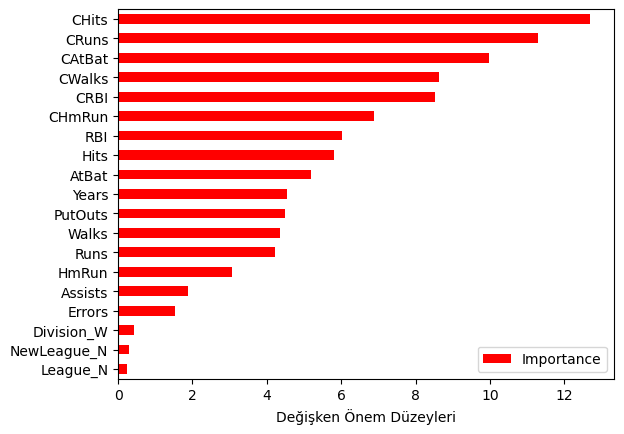

In [320]:
Importance.sort_values(by = "Importance", 
                       axis = 0, 
                       ascending = True).plot(kind ="barh", color = "r")

plt.xlabel("Değişken Önem Düzeyleri")

# Gradient Boosting Machines (GBM)
AdaBoost'un sınıflandırma ve regresyon problemlerine kolayca uyarlanabilen genelleştirilmiş versiyonudur. Artıklar üzerine tek bir tahminsel model formunda olan modeller serisi kurulur. \
Adaptive Boosting(adaBoost) zayıf sınıflandırıcıların bir araya gelerek güçlü bir sınıflandırıcı oluşturması fikrini hayata geçiren algoritmadır.

In [323]:
from sklearn.ensemble import GradientBoostingRegressor

In [325]:
gbm_model = GradientBoostingRegressor()
gbm_model.fit(X_train, y_train)

GradientBoostingRegressor()

## Tahmin

In [327]:
y_pred = gbm_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

353.9224989904392

## Model Tuning

In [329]:
gbm_params = {
    'learning_rate': [0.001, 0.01, 0.1, 0.2],
    'max_depth': [3, 5, 8,50,100],
    'n_estimators': [200, 500, 1000, 2000],
    'subsample': [1,0.5,0.75],
}

In [331]:
gbm = GradientBoostingRegressor() #yaklaşık 10 dakika sürdü
gbm_cv_model = GridSearchCV(gbm, gbm_params, cv = 10, n_jobs = -1, verbose = 2) #verbose iterasyonları gözlemlemek için arguman
gbm_cv_model.fit(X_train, y_train)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
[CV] END learning_rate=0.001, max_depth=3, n_estimators=200, subsample=1; total time=   0.3s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=200, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=200, subsample=0.5; total time=   0.2s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=200, subsample=0.75; total time=   0.3s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=500, subsample=1; total time=   0.8s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=500, subsample=0.5; total time=   0.5s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=500, subsample=0.75; total time=   0.6s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=1; total time=   1.3s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=1; total time=   1.3s
[CV] END learning_rate=0.001, max_depth=3, n_estimators=1000, subsample=0.5; total t

GridSearchCV(cv=10, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 8, 50, 100],
                         'n_estimators': [200, 500, 1000, 2000],
                         'subsample': [1, 0.5, 0.75]},
             verbose=2)

In [332]:
gbm_cv_model.best_params_

{'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 2000, 'subsample': 0.75}

In [368]:
gbm_tuned = GradientBoostingRegressor(learning_rate = 0.2,  
                                      max_depth = 3, 
                                      n_estimators = 2000, 
                                      subsample = 0.75)

gbm_tuned = gbm_tuned.fit(X_train,y_train)

In [369]:
y_pred = gbm_tuned.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

366.24378254055443

In [339]:
#değişkenlerin bağımlı değişkene etkileri:
Importance = pd.DataFrame({"Importance": gbm_tuned.feature_importances_*100},
                         index = X_train.columns)

Text(0.5, 0, 'Değişken Önem Düzeyleri')

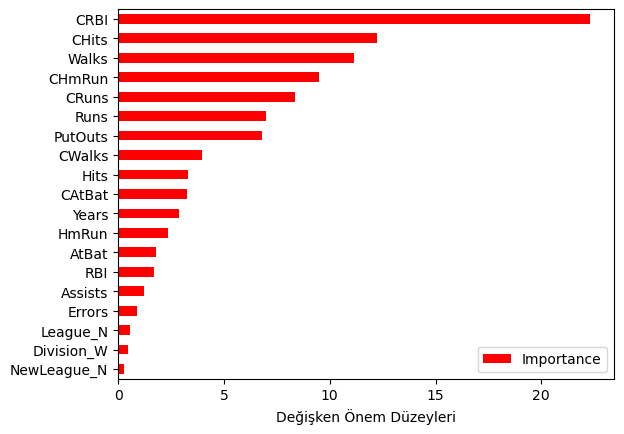

In [341]:
Importance.sort_values(by = "Importance", 
                       axis = 0, 
                       ascending = True).plot(kind ="barh", color = "r")

plt.xlabel("Değişken Önem Düzeyleri")

# XGBoost
XGBoost, GBM'in hız ve tahmin performansını arttırmak üzere optimize edilmiş, ölçeklenebilir ve farklı platformlara entegre edilebilir halidir.\
xgboost kullanırken standart pandas veya numpy kullanmak yerine XGBoost'un kendi veriyapısı kullanılırsa daha performanslı veri sonuçları elde edilir.

In [344]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)


In [ ]:
#!pip install xgboost

In [352]:
import xgboost as xgb

In [353]:
DM_train = xgb.DMatrix(data = X_train, label = y_train)
DM_test = xgb.DMatrix(data = X_test, label = y_test)

In [356]:
from xgboost import XGBRegressor

In [358]:
xgb_model = XGBRegressor().fit(X_train, y_train)

## Tahmin

In [360]:
y_pred = xgb_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

366.3863437634965

## Model Tuning

In [362]:
xgb_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [364]:
xgb_grid = {
     'colsample_bytree': [0.4, 0.5,0.6,0.9,1],#colsample_bytree ağaç başına değişkenlerden alınacak örnek oranı,
     'n_estimators':[100, 200, 500, 1000],
     'max_depth': [2,3,4,5,6], #overfitting'i engellemek için kullanılan değişken. 
     'learning_rate': [0.1, 0.01, 0.5] #overfitting'i engellemek için kullanılan değişken. 
}

In [366]:
xgb = XGBRegressor() # yaklaşık 2 dakika
xgb_cv = GridSearchCV(xgb, 
                      param_grid = xgb_grid, 
                      cv = 10, 
                      n_jobs = -1,
                      verbose = 2)

xgb_cv.fit(X_train, y_train)

Fitting 10 folds for each of 300 candidates, totalling 3000 fits
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=1; total time=   2.2s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.6s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.5; total time=   1.6s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, subsample=0.75; total time=   2.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=2000, subsample=1; total time=   2.6s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=2000, subsample=0.5; total time=   2.6s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=2000, subsample=0.5; total time=   2.5s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=2000, subsample=0.75; total time=   2.6s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=200, subsample=1; total time=   0.7s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=200, subsample=0.5; total time=   0.4s
[

GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None,...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.4, 0.5, 0.6, 0.9, 1],
                         'learning_rate': [0.1, 0.01, 0.5],
                         'max_depth': [2, 3, 4, 5, 6],
                         'n_estimators': [100, 200, 500, 1000]},
             verbose=2)

In [415]:
xgb_cv.best_params_

{'colsample_bytree': 0.5,
 'learning_rate': 0.5,
 'max_depth': 2,
 'n_estimators': 100}

In [421]:
xgb_tuned = XGBRegressor(colsample_bytree = 0.5, 
                         learning_rate = 0.5, 
                         max_depth = 2, 
                         n_estimators = 100) 

xgb_tuned = xgb_tuned.fit(X_train,y_train)

In [423]:
y_pred = xgb_tuned.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

348.2693031644689

**NOT** hiperparametre optimizasyonu için yaygın kullanım: En önemli-etkili parametreler toplu şekilde değil, tek tek optimum değerleri aranır, daha sonrasında toplu şekilde aranır.

# Light GBM
XGBoost'un eğitim süresi performansını arttırmaya yönelik geliştirilen bir diğer GBM türüdür. Breadth_first search(BFS) yerine depth_first search(DFS) kullanır.

In [33]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)


In [427]:
#!pip install lightgbm
#from lightgm import LGBMRegressor
#eğer import edilmediyse aşağıdaki kod satırından import etmeyi deneyin

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 2.6 MB/s eta 0:00:0000:0100:010m


In [35]:
#conda install -c conda-forge lightgbm
from lightgbm import LGBMRegressor

In [37]:
lgbm = LGBMRegressor()
lgbm_model = lgbm.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 831
[LightGBM] [Info] Number of data points in the train set: 197, number of used features: 19
[LightGBM] [Info] Start training from score 543.483442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

## Tahmin

In [39]:
y_pred = lgbm_model.predict(X_test, 
                            num_iteration = lgbm_model.best_iteration_)

In [41]:
np.sqrt(mean_squared_error(y_test, y_pred))

363.8712087611089

## Model Tuning

In [43]:
lgbm_model

LGBMRegressor()

In [45]:
lgbm_grid = {
    'colsample_bytree': [0.4, 0.6, 0.8],
    'learning_rate': [0.01, 0.1, 0.5],
    'n_estimators': [10, 50, 100,],
    'max_depth': [1,2,3,4,5,6] }

lgbm = LGBMRegressor()
lgbm_cv_model = GridSearchCV(lgbm, lgbm_grid, cv=10, n_jobs = -1, verbose = -1)

In [47]:
lgbm_cv_model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 761
[LightGBM] [Info] Number of data points in the train set: 177, number of used features: 19
[LightGBM] [Info] Start training from score 532.690209
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 760
[LightGBM] [Info] Number of data points in the train set: 177, number of used features: 19
[LightGBM] [Info] Start training from score 541.048424
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 766
[LightGBM] [Info] Number of data points in the train set: 178, number of used features: 19
[LightGBM] [Info] Start training

GridSearchCV(cv=10, estimator=LGBMRegressor(), n_jobs=-1,
             param_grid={'colsample_bytree': [0.4, 0.6, 0.8],
                         'learning_rate': [0.01, 0.1, 0.5],
                         'max_depth': [1, 2, 3, 4, 5, 6],
                         'n_estimators': [10, 50, 100]},
             verbose=-1)

In [48]:
lgbm_cv_model.best_params_

{'colsample_bytree': 0.4,
 'learning_rate': 0.1,
 'max_depth': 4,
 'n_estimators': 50}

In [57]:
lgbm_tuned = LGBMRegressor(learning_rate = 0.1, 
                           max_depth = 4, 
                           n_estimators = 50,
                          colsample_bytree = 0.4)

lgbm_tuned = lgbm_tuned.fit(X_train,y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 831
[LightGBM] [Info] Number of data points in the train set: 197, number of used features: 19
[LightGBM] [Info] Start training from score 543.483442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

In [59]:
y_pred = lgbm_tuned.predict(X_test)

In [61]:
np.sqrt(mean_squared_error(y_test, y_pred))

370.63861799311155

# CatBoost
Kategorik değişkenler ile otomatik olarak mücadele edebilen, hızlı, başarılı bir diğer GBM türevidir. Rusyanın ilk açık kaynak kodlu başarılı ML çalışması. 

In [5]:
hit = pd.read_csv("Hitters.csv")
df = hit.copy()
df = df.dropna()
dms = pd.get_dummies(df[['League', 'Division', 'NewLeague']])
y = df["Salary"]
X_ = df.drop(['Salary', 'League', 'Division', 'NewLeague'], axis=1).astype('float64')
X = pd.concat([X_, dms[['League_N', 'Division_W', 'NewLeague_N']]], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)


In [ ]:
#!pip install catboost
#conda install -c conda-forge catboost

In [7]:
from catboost import CatBoostRegressor

In [9]:
catb = CatBoostRegressor()
catb_model = catb.fit(X_train, y_train)

Learning rate set to 0.031674
0:	learn: 437.6430699	total: 68.6ms	remaining: 1m 8s
1:	learn: 431.3923642	total: 70.3ms	remaining: 35.1s
2:	learn: 424.8820360	total: 71.8ms	remaining: 23.9s
3:	learn: 418.2514904	total: 73.1ms	remaining: 18.2s
4:	learn: 412.6394021	total: 74.5ms	remaining: 14.8s
5:	learn: 406.6247020	total: 75.7ms	remaining: 12.5s
6:	learn: 400.5321206	total: 76.9ms	remaining: 10.9s
7:	learn: 394.6683437	total: 78.3ms	remaining: 9.71s
8:	learn: 388.2496484	total: 79.4ms	remaining: 8.74s
9:	learn: 382.9448842	total: 80.5ms	remaining: 7.97s
10:	learn: 377.2600080	total: 81.4ms	remaining: 7.32s
11:	learn: 372.4829606	total: 82.3ms	remaining: 6.78s
12:	learn: 366.6823437	total: 83.3ms	remaining: 6.32s
13:	learn: 362.6076230	total: 84.2ms	remaining: 5.93s
14:	learn: 358.0107745	total: 85.1ms	remaining: 5.59s
15:	learn: 353.2802665	total: 86.1ms	remaining: 5.29s
16:	learn: 348.5646265	total: 86.9ms	remaining: 5.02s
17:	learn: 343.6407912	total: 87.6ms	remaining: 4.78s
18:	lear

## Tahmin

In [11]:
y_pred = catb_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

351.194631344607

## Model Tuning

In [21]:
catb_grid = {
    'iterations': [100,300,500],
    'learning_rate': [0.01, 0.03, 0.05],
    'depth': [3,4,5,6] }

In [23]:
catb = CatBoostRegressor()
catb_cv_model = GridSearchCV(catb, catb_grid, cv=5, n_jobs = -1, verbose = -1)

In [25]:
catb_cv_model.fit(X_train, y_train)

0:	learn: 423.4375355	total: 59.2ms	remaining: 5.86s
1:	learn: 421.1765508	total: 60.5ms	remaining: 2.96s
2:	learn: 419.0857364	total: 61.7ms	remaining: 1.99s
3:	learn: 416.9452654	total: 62.9ms	remaining: 1.51s
4:	learn: 414.7312054	total: 64.1ms	remaining: 1.22s
5:	learn: 412.7163500	total: 65.1ms	remaining: 1.02s
6:	learn: 410.8901481	total: 66.1ms	remaining: 878ms
7:	learn: 408.9530169	total: 67.2ms	remaining: 773ms
8:	learn: 407.1127322	total: 68.3ms	remaining: 691ms
9:	learn: 404.9830351	total: 69.3ms	remaining: 624ms
10:	learn: 402.8219949	total: 70.3ms	remaining: 568ms
11:	learn: 400.8572723	total: 71ms	remaining: 521ms
12:	learn: 399.1287133	total: 71.8ms	remaining: 481ms
13:	learn: 397.2954867	total: 72.6ms	remaining: 446ms
14:	learn: 395.2920342	total: 73.5ms	remaining: 416ms
15:	learn: 393.5502831	total: 74.3ms	remaining: 390ms
16:	learn: 391.6542300	total: 75.1ms	remaining: 367ms
17:	learn: 389.8509633	total: 75.9ms	remaining: 346ms
18:	learn: 387.9570076	total: 76.7ms	rem

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x1419e7750>,
             n_jobs=-1,
             param_grid={'depth': [3, 4, 5, 6], 'iterations': [100, 300, 500],
                         'learning_rate': [0.01, 0.03, 0.05]},
             verbose=-1)

In [27]:
catb_cv_model.best_params_

{'depth': 3, 'iterations': 500, 'learning_rate': 0.05}

In [29]:
catb_tuned = CatBoostRegressor(iterations = 500, 
                               learning_rate = 0.05, 
                               depth = 3)

catb_tuned = catb_tuned.fit(X_train,y_train)

0:	learn: 435.2001987	total: 1.3ms	remaining: 649ms
1:	learn: 424.1004980	total: 2.02ms	remaining: 502ms
2:	learn: 414.9921052	total: 2.4ms	remaining: 398ms
3:	learn: 405.9396833	total: 2.89ms	remaining: 358ms
4:	learn: 397.4585516	total: 3.33ms	remaining: 330ms
5:	learn: 389.0401391	total: 3.85ms	remaining: 317ms
6:	learn: 381.9450554	total: 4.27ms	remaining: 301ms
7:	learn: 373.7917333	total: 4.76ms	remaining: 293ms
8:	learn: 366.0434703	total: 5.32ms	remaining: 290ms
9:	learn: 360.3202859	total: 5.63ms	remaining: 276ms
10:	learn: 352.9267760	total: 5.97ms	remaining: 265ms
11:	learn: 348.4606767	total: 6.29ms	remaining: 256ms
12:	learn: 342.2317316	total: 6.57ms	remaining: 246ms
13:	learn: 336.6909505	total: 6.87ms	remaining: 238ms
14:	learn: 330.6683295	total: 7.17ms	remaining: 232ms
15:	learn: 325.9139187	total: 7.59ms	remaining: 229ms
16:	learn: 320.7696963	total: 8.05ms	remaining: 229ms
17:	learn: 316.0082089	total: 8.36ms	remaining: 224ms
18:	learn: 311.4637951	total: 8.7ms	rema

In [31]:
y_pred = catb_tuned.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

328.8622075674009